In [1]:
import rapids_singlecell as rsc

## **Import Packages for GPU-based**

In [2]:
import scanpy as sc 
import pandas as pd
import seaborn as sns
import numpy as np
from scipy.stats import median_abs_deviation
import os
import warnings
warnings.filterwarnings('ignore', 'Expected')
warnings.simplefilter('ignore')

import scipy.sparse as sp
import anndata 
from anndata import AnnData
import matplotlib

import time
import cuda
import cudf
import cupy

from cuml.decomposition import PCA
from cuml.manifold import TSNE
from cuml.cluster import KMeans
from cuml.preprocessing import StandardScaler



In [3]:
import rmm
from rmm.allocators.cupy import rmm_cupy_allocator

rmm.reinitialize(
    managed_memory=True,
)

cupy.cuda.set_allocator(rmm_cupy_allocator)

In [4]:
print(sc.__dir__())

['__name__', '__doc__', '__package__', '__loader__', '__spec__', '__path__', '__file__', '__cached__', '__builtins__', '_version', '__version__', 'logging', '_settings', '_utils', '_compat', 'settings', 'Verbosity', 'get', 'neighbors', 'preprocessing', 'readwrite', 'tools', 'tl', 'pp', 'plotting', 'pl', 'datasets', 'queries', 'external', 'metrics', 'experimental', 'AnnData', 'concat', 'read_h5ad', 'read_csv', 'read_excel', 'read_hdf', 'read_loom', 'read_mtx', 'read_text', 'read_umi_tools', 'read', 'read_10x_h5', 'read_10x_mtx', 'write', 'read_visium', 'Neighbors', 'set_figure_params']


In [5]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor="white")

2024-04-10 22:56:28.375911: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-10 22:56:28.423987: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-10 22:56:28.424035: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-10 22:56:28.424964: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-10 22:56:28.432284: I tensorflow/core/platform/cpu_feature_guar

scanpy==1.9.8 anndata==0.10.6 umap==0.5.5 numpy==1.24.4 scipy==1.12.0 pandas==1.5.3 scikit-learn==1.4.1.post1 statsmodels==0.14.1 pynndescent==0.5.11


In [6]:
results_file = "/home/supakorn/rscript/results/GSE178265_results.h5ad"

### Read h5ad file or MTX, Feature and Barcode files from GEO

In [7]:
matrix = '/home/supakorn/rscript/dataset/GSE178265/GSE178265_Homo_matrix.mtx.gz'
feature = '/home/supakorn/rscript/dataset/GSE178265/GSE178265_Homo_features.tsv.gz'
barcode = '/home/supakorn/rscript/dataset/GSE178265/GSE178265_Homo_bcd.tsv.gz'

In [8]:
adata = sc.read_mtx(matrix)

In [9]:
adata_bc = pd.read_csv(barcode, header=None)
adata_feature = pd.read_csv(feature, header=None)

In [10]:
adata_bc

,0
0,pPDCN4340DAPIA030419_AATGCCACACAAGCAG-1
1,pPDCN4340DAPIA030419_AGACTCAGTCACAATC-1
2,pPDCN4340DAPIA030419_ATACTTCCAGCGTTGC-1
3,pPDCN4340DAPIA030419_ATATCCTGTGTGTTTG-1
4,pPDCN4340DAPIA030419_ATCCACCGTGGGTTGA-1
...,...
434335,pPDsHSrSNxi3298d200429PosB_CATACTTGTCTGATCA-1
434336,pPDsHSrSNxi3298d200429PosB_TTTGTTGTCCTTGAAG-1
434337,pPDsHSrSNxi3298d200429PosB_ACACTGACACTAGAGG-1
434338,pPDsHSrSNxi3298d200429PosB_CAACAACAGCTCGAAG-1


In [11]:
adata_feature

,0
0,RP11-34P13.3\tRP11-34P13.3\tGene Expression
1,FAM138A\tFAM138A\tGene Expression
2,OR4F5\tOR4F5\tGene Expression
3,RP11-34P13.7\tRP11-34P13.7\tGene Expression
4,RP11-34P13.8\tRP11-34P13.8\tGene Expression
...,...
41620,RN7SL739P\tRN7SL739P\tGene Expression
41621,MIR4502\tMIR4502\tGene Expression
41622,RNU4-10P\tRNU4-10P\tGene Expression
41623,RN7SL865P\tRN7SL865P\tGene Expression


In [12]:
adata_bc[['Patient', 'Barcode']] = adata_bc[0].str.split('_', expand=True)
adata_bc.drop(columns=[0], inplace=True)
adata_bc

,Patient,Barcode
0,pPDCN4340DAPIA030419,AATGCCACACAAGCAG-1
1,pPDCN4340DAPIA030419,AGACTCAGTCACAATC-1
2,pPDCN4340DAPIA030419,ATACTTCCAGCGTTGC-1
3,pPDCN4340DAPIA030419,ATATCCTGTGTGTTTG-1
4,pPDCN4340DAPIA030419,ATCCACCGTGGGTTGA-1
...,...,...
434335,pPDsHSrSNxi3298d200429PosB,CATACTTGTCTGATCA-1
434336,pPDsHSrSNxi3298d200429PosB,TTTGTTGTCCTTGAAG-1
434337,pPDsHSrSNxi3298d200429PosB,ACACTGACACTAGAGG-1
434338,pPDsHSrSNxi3298d200429PosB,CAACAACAGCTCGAAG-1


In [89]:
list_patient = list(dict.fromkeys(adata_bc['Patient']))
print(len(list_patient))
print(list_patient)

97
['pPDCN4340DAPIA030419', 'pPDCN4340DAPIB030419', 'pPDsHSrSNxi3482d200429PosB', 'pPDsHSrSNxi3346d200429PosB', 'pPDsHSrSNxi3482d200429PosA', 'pPDsHSrSNxi3346d200429PosC', 'pPDsHSrSNxi3873d200429PosA', 'pPDsHSrSNxi5610d200429Pos', 'pPDsHSrSNxi3873d200429PosE', 'pPDsHSrSNxi3322d200429PosG', 'pPDsHSrSNxi3873d200429PosF', 'pPDsHSrSNxi3322d200429PosE', 'pPDsHSrSNxi3346d200429PosA', 'pPDCN3839DAPIB030419', 'pPDsHSrSNxi3345d200429DAPIB', 'pPDsHSrSNxi3482d200429DAPIB', 'pPDsHSrSNxi4956d200429PosA', 'pPDsHSrSNxi3482d200429DAPIA', 'pPDsHSrSNxi3322d200429PosF', 'pPDsHSrSNxi6173d200429DAPIA', 'pPDsHSrSNxi3345d200429DAPIA', 'pPDsHSrSNxi3346d200429DAPIB', 'pPDsHSrSNxi4775d200429PosA', 'pPDsHSrSNxi2544d200429DAPIB', 'pPDsHSrSNxi3887d200429PosB', 'pPDsHSrSNxi3873d200429PosD', 'pPDsHSrSNxi4560d200429PosD', 'pPDsHSrSNxi4956d200429DAPIB', 'pPDsHSrSNxi3322d200429PosC', 'pPDsHSrSNxi3873d200429DAPIA', 'pPDsHSrSNxi3322d200429DAPIA', 'pPDsHSrSNxi4956d200429DAPIA', 'pPDsHSrSNxi3887d200429DAPIB', 'pPDsHSrSNxi3

In [13]:
adata_feature[['Gene_symbol', 'Gene_symbol_2', 'Expression']] = adata_feature[0].str.split('\t', expand=True)
adata_feature.drop(columns=[0], inplace=True)
adata_feature

,Gene_symbol,Gene_symbol_2,Expression
0,RP11-34P13.3,RP11-34P13.3,Gene Expression
1,FAM138A,FAM138A,Gene Expression
2,OR4F5,OR4F5,Gene Expression
3,RP11-34P13.7,RP11-34P13.7,Gene Expression
4,RP11-34P13.8,RP11-34P13.8,Gene Expression
...,...,...,...
41620,RN7SL739P,RN7SL739P,Gene Expression
41621,MIR4502,MIR4502,Gene Expression
41622,RNU4-10P,RNU4-10P,Gene Expression
41623,RN7SL865P,RN7SL865P,Gene Expression


In [14]:
# Transpose adata_mtx
# Now, sc_Matrix = Cells/Barcode (rows) x Genes (columns)
adata = adata.T
adata.X

<434340x41625 sparse matrix of type '<class 'numpy.float32'>'
	with 1654688953 stored elements in Compressed Sparse Column format>

In [17]:
adata

AnnData object with n_obs × n_vars = 434340 × 41625

In [18]:
# Assign Variable (var) and Observation (obs) to Anndata from barcode.tsv and feature.tsv

adata.var_names = adata_feature['Gene_symbol']
adata.obs_names = adata_bc['Barcode']

In [22]:
adata.var

""
Gene_symbol
RP11-34P13.3
FAM138A
OR4F5
RP11-34P13.7
RP11-34P13.8
...
RN7SL739P
MIR4502
RNU4-10P


In [24]:
adata

AnnData object with n_obs × n_vars = 434340 × 41625

In [25]:
adata.obs['patient'] = adata_bc['Patient'].values
adata.var['gene_name'] = adata_feature['Gene_symbol'].values

In [33]:
adata.X

<434340x41625 sparse matrix of type '<class 'numpy.float32'>'
	with 1654688953 stored elements in Compressed Sparse Column format>

In [28]:
adata.var

,gene_name
Gene_symbol,
RP11-34P13.3,RP11-34P13.3
FAM138A,FAM138A
OR4F5,OR4F5
RP11-34P13.7,RP11-34P13.7
RP11-34P13.8,RP11-34P13.8
...,...
RN7SL739P,RN7SL739P
MIR4502,MIR4502
RNU4-10P,RNU4-10P


In [29]:
mat = adata.X.todense()

In [30]:
mat.shape

(434340, 41625)

In [31]:
gene = adata.var.index.tolist()
cell = adata.obs.index.tolist()

In [32]:
adata_df = pd.DataFrame(mat, columns=gene, index=cell)
adata_df

,RP11-34P13.3,FAM138A,OR4F5,RP11-34P13.7,RP11-34P13.8,RP11-34P13.14,RP11-34P13.9,FO538757.3,FO538757.2,AP006222.2,...,RNU2-71P,RNA5SP252,AC116533.2,AC114494.1,RN7SL424P,RN7SL739P,MIR4502,RNU4-10P,RN7SL865P,RNU6-191P
AATGCCACACAAGCAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AGACTCAGTCACAATC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ATACTTCCAGCGTTGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ATATCCTGTGTGTTTG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ATCCACCGTGGGTTGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CATACTTGTCTGATCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TTTGTTGTCCTTGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ACACTGACACTAGAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CAACAACAGCTCGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [26]:
adata_df.transpose()

,AATGCCACACAAGCAG-1,AGACTCAGTCACAATC-1,ATACTTCCAGCGTTGC-1,ATATCCTGTGTGTTTG-1,ATCCACCGTGGGTTGA-1,ATCCGTCGTCACGACC-1,ATCGTAGCAAGCTGCC-1,ATGCCTCTCTGGGATT-1,ATTCCATAGTTTCTTC-1,CACACAACACTATCGA-1,...,TCGTGGGAGATCCCAT-1,TGCTCCAGTGGCTCTG-1,ATGGGTTTCTATCCAT-1,AAGCCATAGGATACCG-1,ATTCTTGTCCGCAAAT-1,CATACTTGTCTGATCA-1,TTTGTTGTCCTTGAAG-1,ACACTGACACTAGAGG-1,CAACAACAGCTCGAAG-1,TGAGCATCAGACAAGC-1
RP11-34P13.3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FAM138A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
OR4F5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RP11-34P13.7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RP11-34P13.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RN7SL739P,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MIR4502,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RNU4-10P,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RN7SL865P,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## **Quality Control and Filtering**

In [34]:
rsc.get.anndata_to_GPU(adata) ## Move adata.X to GPU

In [35]:
#merged_adata.var["mt"] = merged_adata.var_names.str.startswith("MT-")

rsc.pp.flag_gene_family(adata, gene_family_name="mt", gene_family_prefix="MT-")

rsc.pp.calculate_qc_metrics(adata, 
                            qc_vars=["mt"], 
                            log1p=True)

In [36]:
adata

AnnData object with n_obs × n_vars = 434340 × 41625
    obs: 'patient', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'

### **Plot QC**

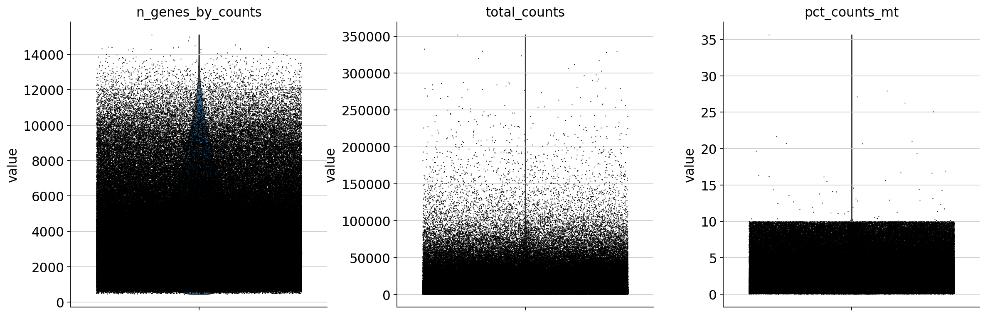

In [37]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True)

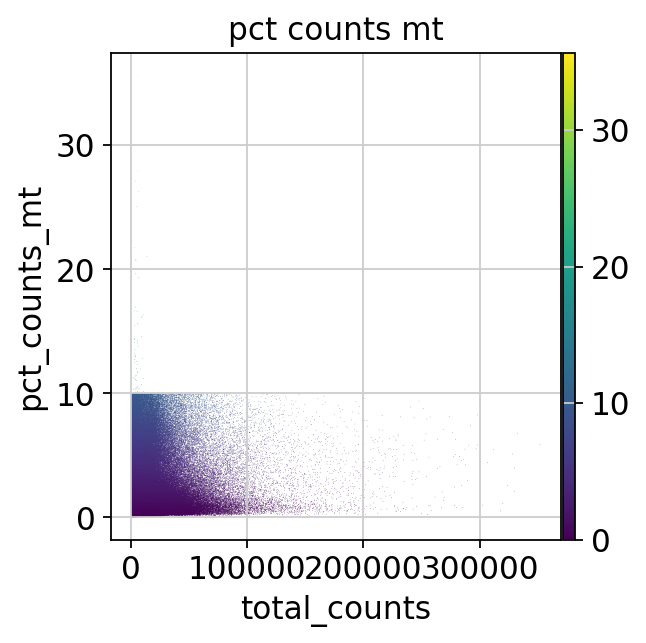

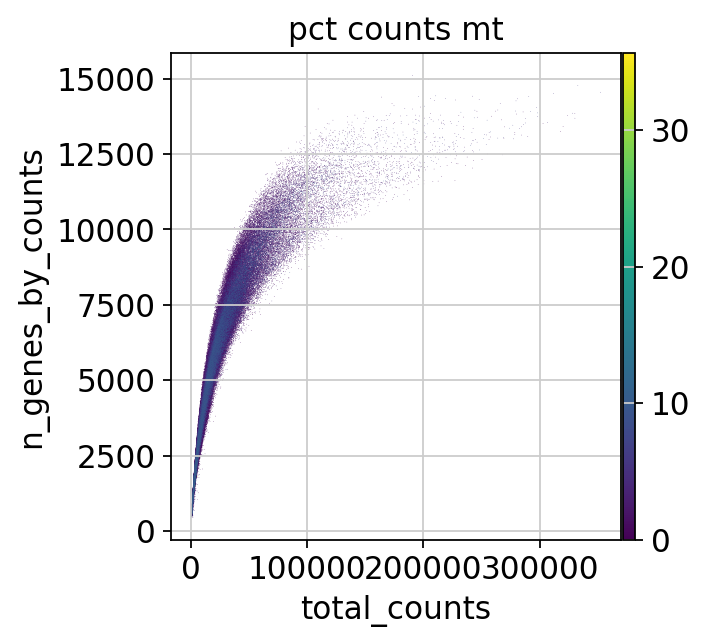

In [38]:
sc.pl.scatter(adata, x="total_counts", y="pct_counts_mt", color="pct_counts_mt")
sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt")

### **Outlier Threshold**

#### ***MAD = median(|Xi - median(X)|)***
Xi is the respective QC metric of an observation and 
describes a robust statistic of the variability of the metric.
[Germain et al., 2020]

In [39]:
#def is_outlier(merged_adata, metric: str, nmads: int):
#    M = merged_adata.obs[metric]
#    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
#        np.median(M) + nmads * median_abs_deviation(M) < M
#    )
#    return outlier

In [40]:
#merged_adata.obs["outlier"] = (
#    is_outlier(merged_adata, "log1p_total_counts", 5) |
#    is_outlier(merged_adata, "log1p_n_genes_by_counts", 5) #|
#    #is_outlier(merged_adata, "pct_counts_in_top_20_genes", 5)    
#)
#merged_adata.obs.outlier.value_counts()

In [41]:
#merged_adata.obs["mt_outlier"] = is_outlier(merged_adata, "pct_counts_mt", 3) | (
#    merged_adata.obs["pct_counts_mt"] > 20
#)
#merged_adata.obs.mt_outlier.value_counts()

In [42]:
#print(f"Total number of cells: {merged_adata.n_obs}")
#merged_adata = merged_adata[(~merged_adata.obs.outlier) & (~merged_adata.obs.mt_outlier)].copy()
#
#print(f"Number of cells after filtering of low quality cells: {merged_adata.n_obs}")

In [43]:
#sc.pl.scatter(adata, x="total_counts", y="n_genes_by_counts", color="pct_counts_mt")

### **Filtering**

In [44]:
adata

AnnData object with n_obs × n_vars = 434340 × 41625
    obs: 'patient', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'

In [45]:
#print(f"Total number of genes: {merged_adata.n_vars}")
#rsc.pp.filter_cells(merged_adata, min_count=3)
#rsc.pp.filter_cells(merged_adata, max_count=20000)
#print(f"Number of genes after cell filter: {merged_adata.n_vars}")


adata = adata[adata.obs.pct_counts_mt < 20, :]
adata = adata[adata.obs.n_genes_by_counts < 12000, :]
adata = adata[adata.obs.n_genes_by_counts > 300, :]

In [46]:
rsc.pp.filter_genes(adata, min_count=3)

filtered out 3031 genes based on n_cells_by_counts


In [47]:
adata

AnnData object with n_obs × n_vars = 433186 × 38594
    obs: 'patient', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts'

### **Plot after filtering**

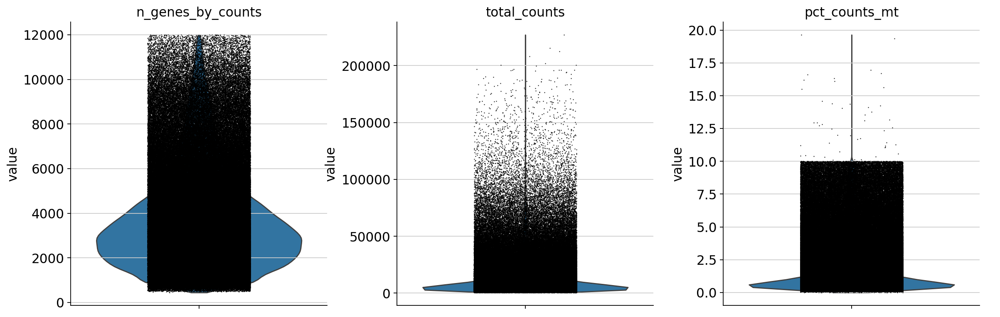

In [48]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.2,
    multi_panel=True)

In [49]:
adata.layers["counts"] = adata.X.copy()
adata.shape

(433186, 38594)

## **Normalization**

In [50]:
rsc.pp.normalize_total(adata, target_sum=1e4)

In [51]:
rsc.pp.log1p(adata)

In [52]:
rsc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor="seurat_v3", layer = "counts")


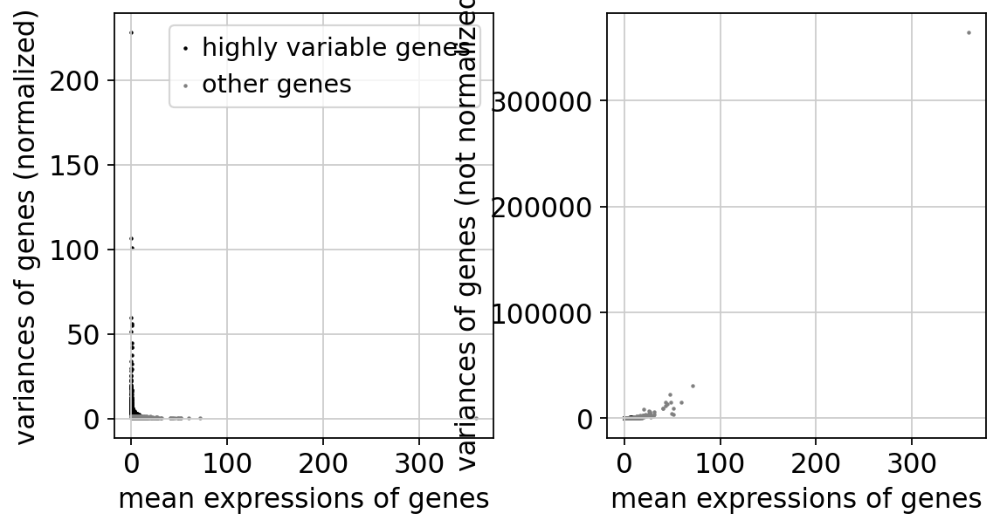

In [53]:
sc.pl.highly_variable_genes(adata)

### Create .raw file

In [54]:
adata.raw = adata

In [55]:
adata = adata[:, adata.var.highly_variable]

## **Regress out unwanted variable**

In [56]:
rsc.pp.regress_out(adata, keys=["total_counts", "pct_counts_mt"])

## **Scale Data**

In [57]:
rsc.pp.scale(adata, max_value=10)

## **Plot PCA**

In [58]:
rsc.pp.pca(adata, n_comps=100)

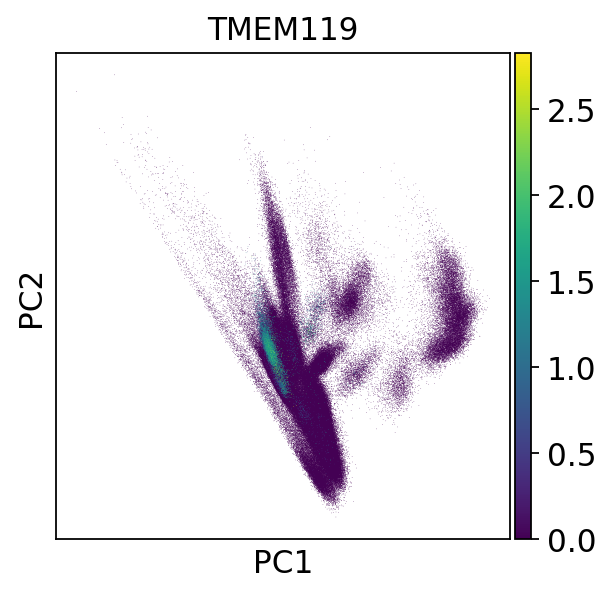

In [59]:
sc.pl.pca(adata, color='TMEM119')

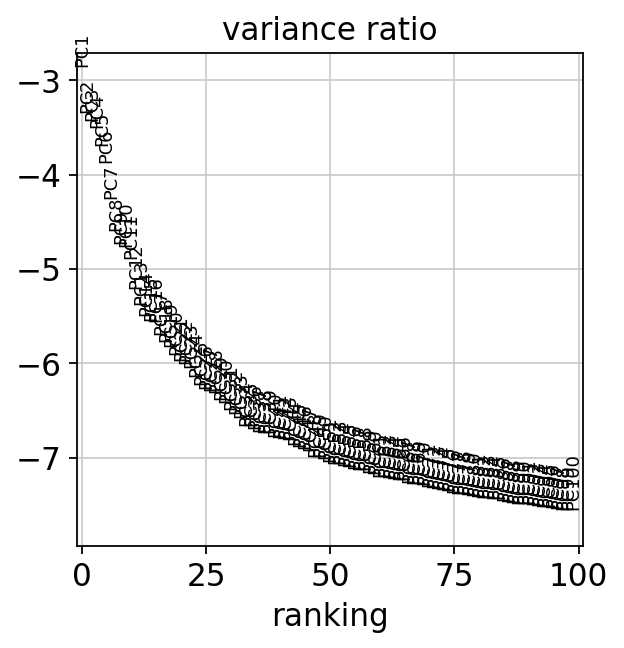

In [60]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=100)

In [61]:
rsc.get.anndata_to_CPU(adata, convert_all=True)

In [62]:
adata

AnnData object with n_obs × n_vars = 433186 × 3000
    obs: 'patient', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'total_counts', 'mean_counts', 'pct_dropout_by_counts', 'log1p_total_counts', 'log1p_mean_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [63]:
adata.write(results_file)

In [64]:
adata_obs_df = pd.DataFrame(adata.obs)

In [65]:
adata_obs_df

,patient,n_genes_by_counts,total_counts,log1p_n_genes_by_counts,log1p_total_counts,total_counts_mt,pct_counts_mt,log1p_total_counts_mt
Barcode,,,,,,,,
AATGCCACACAAGCAG-1,pPDCN4340DAPIA030419,7870,41327.0,8.970940,10.629295,184.0,0.445230,5.220356
AGACTCAGTCACAATC-1,pPDCN4340DAPIA030419,7914,41926.0,8.976515,10.643685,412.0,0.982684,6.023448
ATACTTCCAGCGTTGC-1,pPDCN4340DAPIA030419,4423,14694.0,8.394800,9.595263,299.0,2.034844,5.703783
ATATCCTGTGTGTTTG-1,pPDCN4340DAPIA030419,5435,22773.0,8.600799,10.033375,268.0,1.176832,5.594711
ATCCACCGTGGGTTGA-1,pPDCN4340DAPIA030419,7170,32596.0,8.877800,10.391975,114.0,0.349736,4.744932
...,...,...,...,...,...,...,...,...
CATACTTGTCTGATCA-1,pPDsHSrSNxi3298d200429PosB,3034,11148.0,8.017967,9.319105,974.0,8.736994,6.882438
TTTGTTGTCCTTGAAG-1,pPDsHSrSNxi3298d200429PosB,3163,10443.0,8.059592,9.253783,630.0,6.032749,6.447306
ACACTGACACTAGAGG-1,pPDsHSrSNxi3298d200429PosB,3050,9657.0,8.023225,9.175542,826.0,8.553381,6.717805


In [66]:
adata_var_df = pd.DataFrame(adata.var)
adata_var_df

,gene_name,mt,n_cells_by_counts,total_counts,mean_counts,pct_dropout_by_counts,log1p_total_counts,log1p_mean_counts,highly_variable,highly_variable_rank,means,variances,variances_norm
Gene_symbol,,,,,,,,,,,,,
RP5-857K21.4,RP5-857K21.4,False,110405,298833.0,0.688016,74.580973,12.607643,0.523554,True,2616.0,0.667369,3.824971,1.567565
HES4,HES4,False,78240,176108.0,0.405461,81.986462,12.078858,0.340365,True,2927.0,0.390490,1.555173,1.496173
ISG15,ISG15,False,39145,69253.0,0.159444,90.987475,11.145536,0.147941,True,1571.0,0.150663,0.648009,1.959900
GABRD,GABRD,False,27411,57312.0,0.131952,93.689045,10.956283,0.123944,True,971.0,0.121080,0.585490,2.388933
HES5,HES5,False,7119,11810.0,0.027191,98.360961,9.376786,0.026828,True,1283.0,0.026885,0.092258,2.132341
...,...,...,...,...,...,...,...,...,...,...,...,...,...
RN7SL42P,RN7SL42P,False,16,39.0,0.000090,99.996316,3.688879,0.000090,True,332.0,0.000090,0.001364,3.899282
snoR26,snoR26,False,3,4.0,0.000009,99.999309,1.609438,0.000009,True,2958.0,0.000009,0.000014,1.492084
RN7SL494P,RN7SL494P,False,618,1049.0,0.002415,99.857715,6.956545,0.002412,True,1387.0,0.002401,0.005862,2.063535


### **Batch Correction**

In [67]:
rsc.pp.harmony_integrate(adata, key="patient")

2024-04-10 23:19:45,366 - harmonypy_gpu - INFO - Iteration 1 of 10
2024-04-10 23:20:32,964 - harmonypy_gpu - INFO - Iteration 2 of 10
2024-04-10 23:21:20,104 - harmonypy_gpu - INFO - Iteration 3 of 10
2024-04-10 23:22:07,281 - harmonypy_gpu - INFO - Iteration 4 of 10
2024-04-10 23:22:54,458 - harmonypy_gpu - INFO - Iteration 5 of 10
2024-04-10 23:23:41,739 - harmonypy_gpu - INFO - Iteration 6 of 10
2024-04-10 23:24:28,985 - harmonypy_gpu - INFO - Converged after 6 iterations


## **Find Neighbors**

In [68]:
rsc.pp.neighbors(adata, n_neighbors=20, n_pcs=50)

In [70]:
rsc.tl.umap(adata)
rsc.tl.tsne(adata, perplexity=1000, learning_rate=200)


[W] [23:25:28.637261] Perplexity should be within ranges (5, 50). Your results might be a bit strange...
[W] [23:25:28.637387] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


## **Clustering and Visualization**

In [71]:
rsc.tl.leiden(adata, resolution=0.3)
rsc.tl.louvain(adata, resolution=0.3)

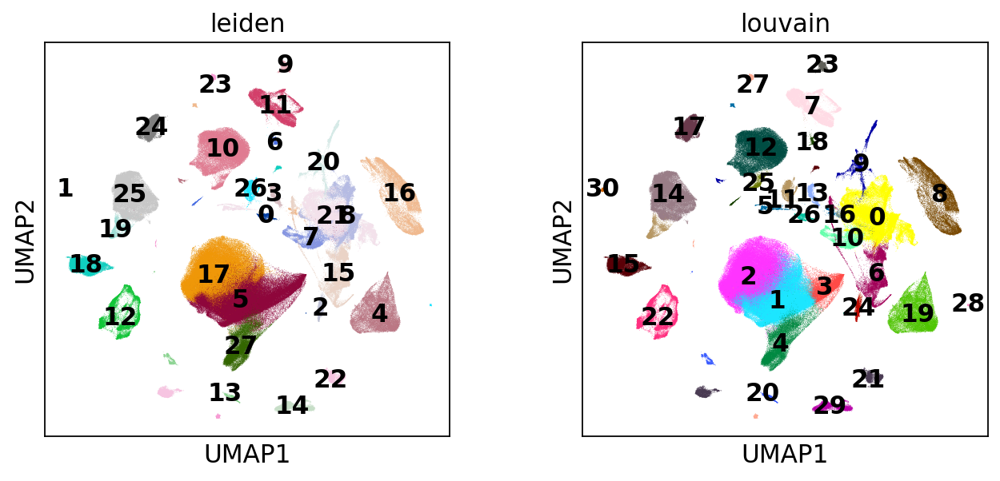

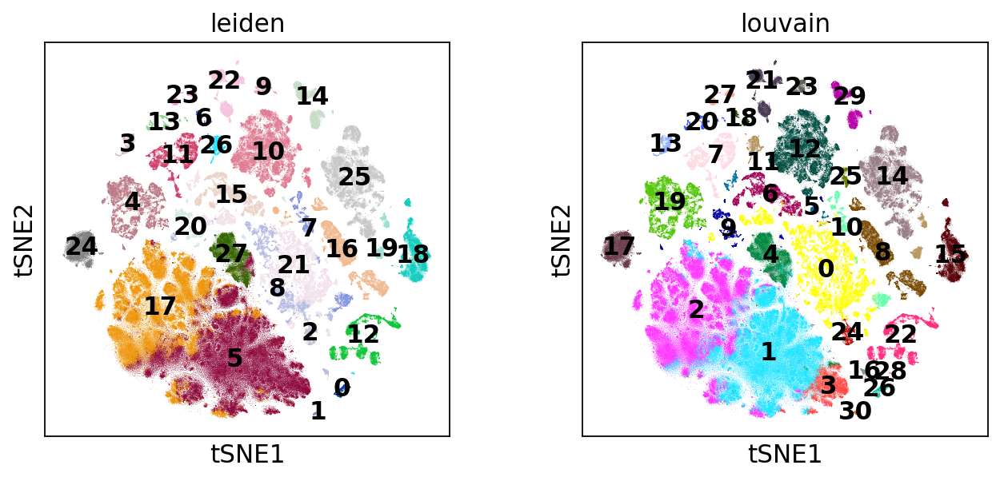

In [72]:
sc.pl.umap(adata, color=["leiden", "louvain"], legend_loc="on data")
sc.pl.tsne(adata, color=["leiden", "louvain"], legend_loc="on data")

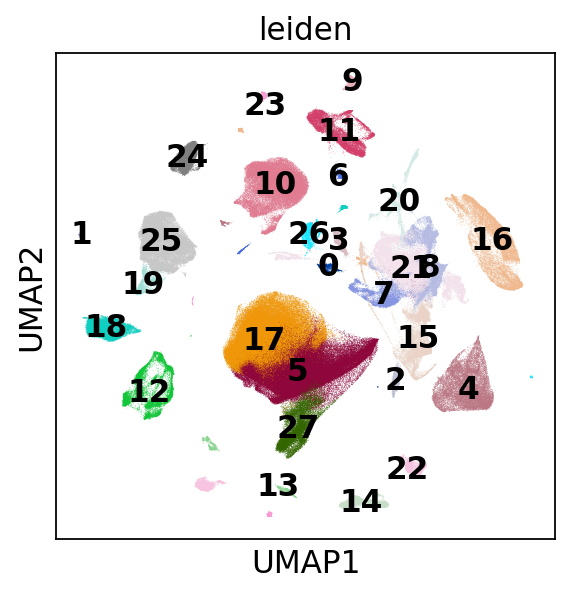

In [73]:
sc.pl.umap(adata, color=["leiden"], legend_loc="on data", use_raw=False, color_map='Reds')

In [74]:
adata.write(results_file)

### UMAP and TSNE with Kmeans

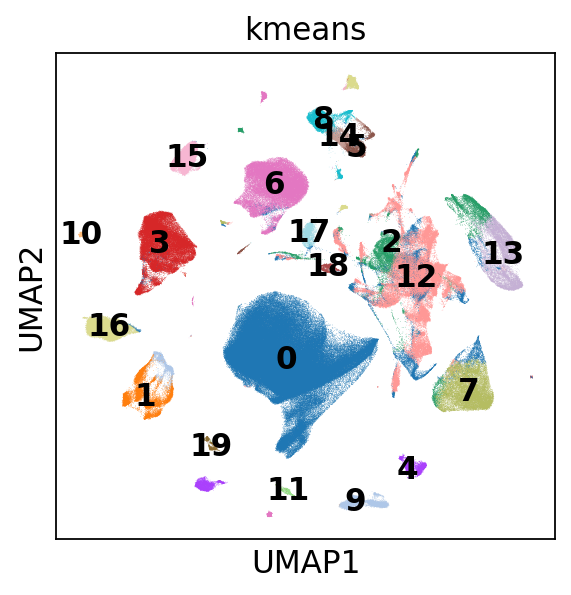

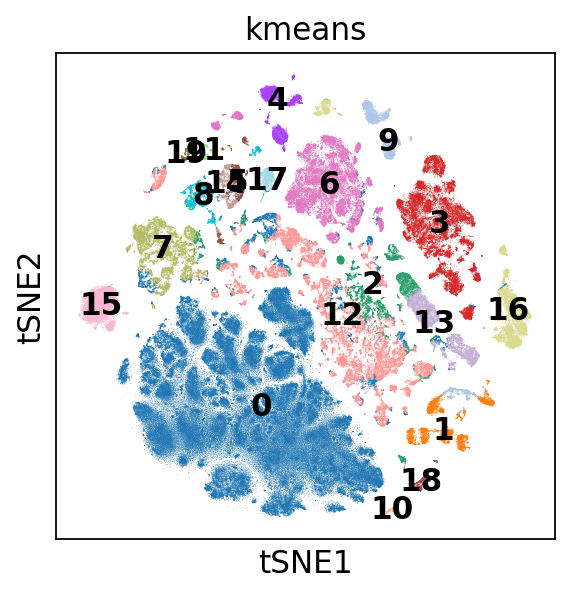

In [75]:
rsc.tl.kmeans(adata, n_clusters=20)

sc.pl.umap(adata, color=["kmeans"], legend_loc = 'on data')
sc.pl.tsne(adata, color=["kmeans"], legend_loc = 'on data')

### Embedding density in the UMAP

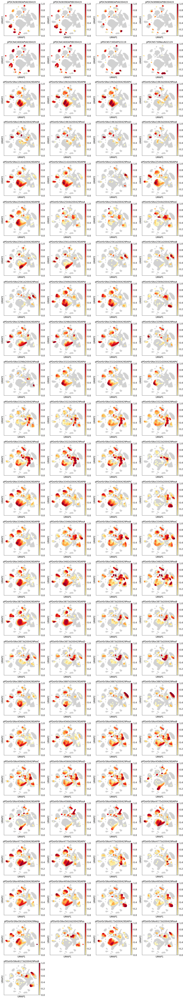

In [76]:
rsc.tl.embedding_density(adata, groupby="patient")
sc.pl.embedding_density(adata, groupby="patient")

## **DE analysis**

[W] [23:32:31.443463] L-BFGS: max iterations reached
[W] [23:32:31.446751] Maximum iterations reached before solver is converged. To increase model accuracy you can increase the number of iterations (max_iter) or improve the scaling of the input data.


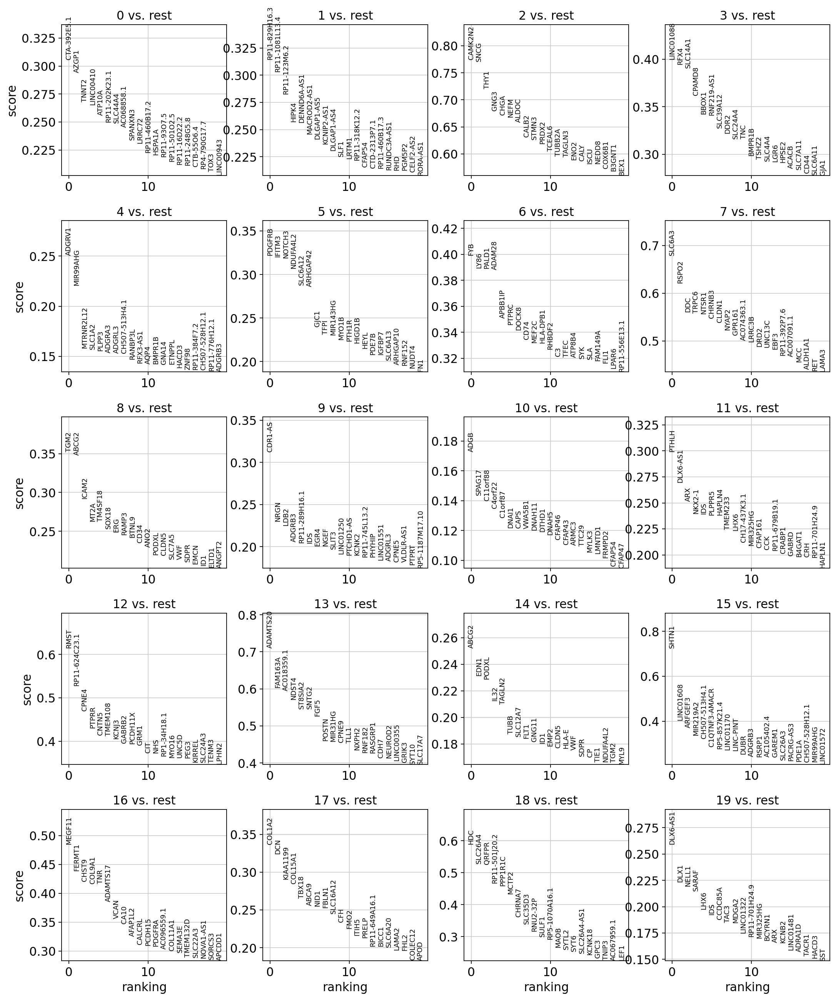

In [77]:
# Methods can be 't-test', 't-test_overestim_var' for overreestimates varience of each group
# 'wilcoxon' for rank-sum
# 'logreg' for logistic regression

rsc.tl.rank_genes_groups_logreg(adata, groupby="kmeans", use_raw=False)
sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False, ncols=4)

In [78]:
sc.settings.verbosity = 2  # reduce the verbosity
adata.write(results_file)

In [79]:
#sc.tl.rank_genes_groups(merged_adata, "leiden", method="wilcoxon")
#sc.pl.rank_genes_groups(merged_adata, n_genes=25, sharey=False, ncols=4)

In [80]:
#sc.tl.rank_genes_groups(merged_adata, "leiden", method="logreg", max_iter=1000)
#sc.pl.rank_genes_groups(merged_adata, n_genes=25, sharey=False, ncols=4)

In [81]:
merged_adata = sc.read(results_file)

In [82]:
pd.DataFrame(adata.uns["rank_genes_groups"]["names"]).head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,CTA-392E5.1,RP11-829H16.3,CAMK2N2,LINC01088,ADGRV1,PDGFRB,FYB,SLC6A3,TGM2,CDR1-AS,ADGB,PTHLH,RMST,ADAMTS20,ABCG2,SHTN1,MEGF11,COL1A2,HDC,DLX6-AS1
1,AZGP1,RP11-1081L13.4,SNCG,RFX4,MIR99AHG,IFITM3,LY86,RSPO2,ABCG2,NRGN,SPAG17,DLX6-AS1,RP11-624C23.1,FAM163A,EDN1,LINC01608,FERMT1,DCN,SLC26A4,DLX1
2,TNNT2,RP11-123M6.2,THY1,SLC14A1,MTRNR2L12,NOTCH3,PALD1,DDC,ICAM2,LDB2,C11orf88,ARX,CPNE4,AC018359.1,PODXL,ARFGEF3,CHST9,KIAA1199,QRFPR,NELL1
3,LINC00410,HIPK4,GNG3,CPAMD8,SLC1A2,NDUFA4L2,ADAM28,TRPC6,MT2A,ADGRB3,C4orf22,NKX2-1,PTPRR,NDST4,IL32,MIR219A2,COL9A1,COL15A1,RP11-501J20.2,SARAF
4,ATP10A,DENND6A-AS1,CHGA,BBOX1,PLPP3,SLC6A12,APBB1IP,NTSR1,TM4SF18,RP11-289H16.1,C1orf87,IDS,CNTN5,ST8SIA2,TAGLN2,CH507-513H4.1,TNR,TBX18,PPP1R1C,LHX6
5,RP11-202K23.1,MACROD2-AS1,NEFM,RNF219-AS1,ADGRA3,ARHGAP42,PTPRC,CHRNB3,SOX18,IDS,DNAI1,PLPPR5,TMEM108,SNTG2,TUBB,C1QTNF3-AMACR,ADAMTS17,ABCA9,MCTP2,IDS
6,SLC44A4,DLGAP1-AS5,ALDOC,SLC39A12,ADGRL3,GJC1,DOCK8,CLDN1,ERG,EGR4,CAPS,HAPLN4,KCNJ3,FGF5,SLC12A7,RP5-857K21.4,VCAN,NID1,CHRNA7,CCDC85A
7,AC068858.1,KCNIP2-AS1,CALB2,DDR2,CH507-513H4.1,TFPI,CD74,NYAP2,RAMP3,NGEF,VWA5B1,TMEM233,GABRB2,POSTN,FLT1,LINC01170,CA10,FBLN1,SLC35D3,TAC3
8,SPANXN3,DLGAP1-AS4,STMN3,SLC24A4,RANBP3L,MIR143HG,MEF2C,GPR161,BTNL9,SLIT3,DNAH11,LHX6,PCDH11X,MIR31HG,GNG11,LINC-PINT,AFAP1L2,SLC16A12,RNU2-32P,MDGA2
9,LRRC72,SLF1,PRDX2,TNC,RFX3-AS1,MYO1B,HLA-DPB1,AC074363.1,CD34,LINC01250,DTHD1,CH17-437K3.1,GRM1,CPNE9,ID1,DUBR,CALCRL,CFH,SULF1,LINC01322


In [83]:
adata.uns

OrderedDict([('log1p', {'base': None}),
             ('hvg', {'flavor': 'seurat_v3'}),
             ('pca',
              {'params': {'zero_center': True, 'use_highly_variable': True},
               'variance': array([137.7848   ,  84.779686 ,  77.60763  ,  72.34461  ,  59.61287  ,
                       49.650417 ,  33.80006  ,  24.253603 ,  20.991816 ,  20.316147 ,
                       17.984077 ,  13.008017 ,  11.01447  ,   9.830831 ,   9.346743 ,
                        9.181325 ,   8.020105 ,   7.4738045,   7.052204 ,   6.5223484,
                        6.0706   ,   5.873383 ,   5.6414766,   5.156761 ,   4.747577 ,
                        4.52325  ,   4.4173765,   4.340954 ,   4.039759 ,   3.905044 ,
                        3.6273978,   3.4812992,   3.3313925,   3.070852 ,   3.0489912,
                        2.9498386,   2.8822074,   2.8471932,   2.8430526,   2.7142527,
                        2.6858037,   2.673349 ,   2.6477897,   2.5066745,   2.4388936,
                    

In [84]:
#result = adata.uns["rank_genes_groups"]
#groups = result["names"].dtype.names
#pd.DataFrame(
#    {
#        group + "_" + key[:1]: result[key][group]
#        for group in groups
#        for key in ["names", "pvals"]
#    }
#).head(10)

ranking genes
    finished (0:01:40)


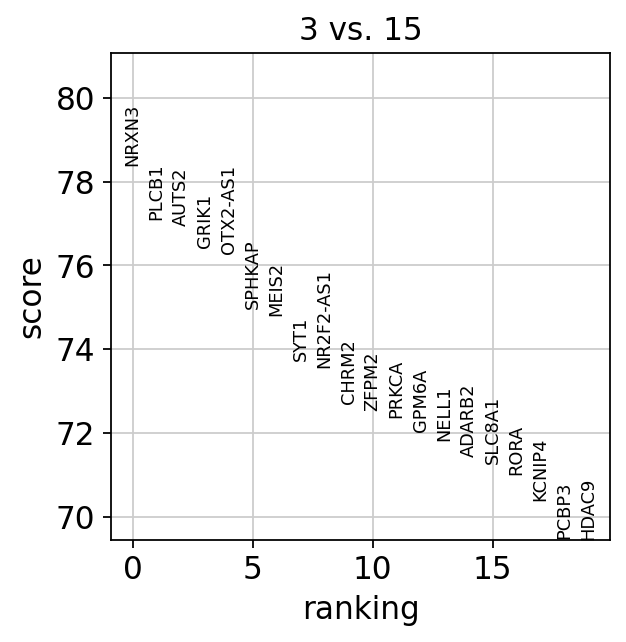

In [85]:
sc.tl.rank_genes_groups(merged_adata, "leiden", groups=["3"], reference="15", method="wilcoxon")
sc.pl.rank_genes_groups(merged_adata, groups=["3"], n_genes=20)

In [86]:
#merged_adata = sc.read(results_file)

In [87]:
#sc.pl.rank_genes_groups_violin(merged_adata, groups="3", n_genes=8)

In [88]:
#sc.pl.violin(merged_adata, ["C3", "P2RY12"], groupby= "leiden", use_raw=False)